In [1]:
import numpy as np
import os
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
def printImage(image):
  from matplotlib import pyplot as plt
  #Show the image with matplotlib
  plt.imshow(image)
  plt.show()

In [3]:
fast = cv2.FastFeatureDetector_create() 
brief = cv2.xfeatures2d.BriefDescriptorExtractor_create()

In [4]:
queryImage_path = "/content/rey_modelo.png"
queryImage = cv2.imread(queryImage_path, cv2.IMREAD_COLOR)
queryImage_keypoints = fast.detect(queryImage, None)
queryImage_keypoints, queryImage_descriptors = brief.compute(queryImage, queryImage_keypoints)

In [5]:
directory_folder = '/content/dataset2_reyCopia'
directory_tocopy_folder = '/content/dataset2_matches'
dir_images = os.listdir(directory_folder)

In [6]:
def detectKeypoints(trainImage):   
  trainImage_keypoints = fast.detect(trainImage, None)  
  trainImage_keypoints, trainImage_descriptors = brief.compute(trainImage, trainImage_keypoints)
  return trainImage_keypoints, trainImage_descriptors

In [7]:
def getMatches(trainImage_descriptors):
  bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
  matches = bf.match(queryImage_descriptors, trainImage_descriptors)
  return matches

In [8]:
def printMatches(trainImage, trainImage_keypoints, matches, dir_tosave_image):
  result = cv2.drawMatches(queryImage, queryImage_keypoints, trainImage, trainImage_keypoints, 
                         matches, trainImage, flags = 0)
  # Display the best matching points
  plt.rcParams['figure.figsize'] = [14.0, 7.0]
  plt.title('Match Points')
  plt.imshow(result)
  plt.show()

  cv2.imwrite(dir_tosave_image,result)


In [9]:
def printKeypoints(trainImage, trainImage_keypoints):
  img=cv2.drawKeypoints(queryImage,queryImage_keypoints,queryImage)
  printImage(queryImage)

  img2=cv2.drawKeypoints(trainImage,trainImage_keypoints,trainImage)
  printImage(trainImage)

In [10]:
# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(queryImage_keypoints))

Number of Keypoints Detected In The Query Image:  513


rey-202Ev5.png
Number of Keypoints Detected In The Training Image:  829


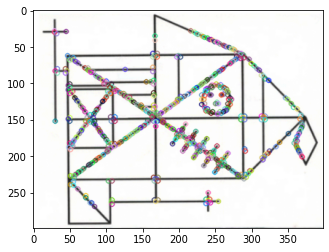

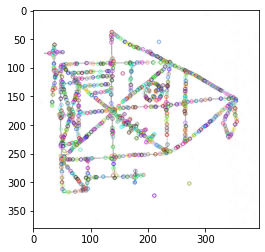


Number of Matching Keypoints Between The Training and Query Images:  178


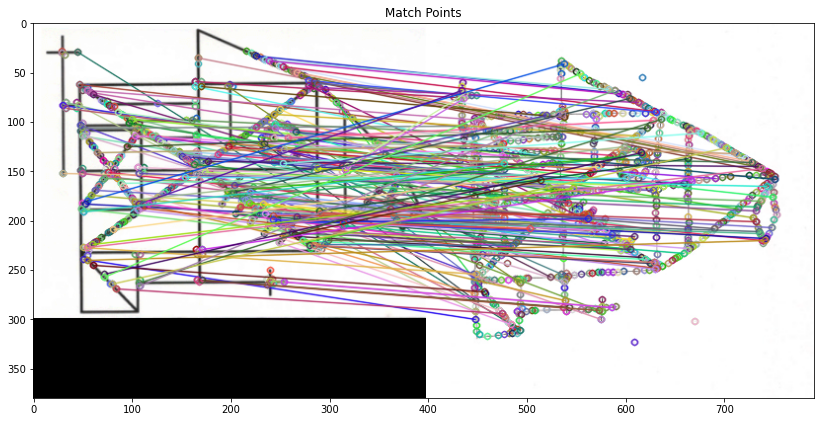

----------------

rey-212Ev2.png
Number of Keypoints Detected In The Training Image:  863


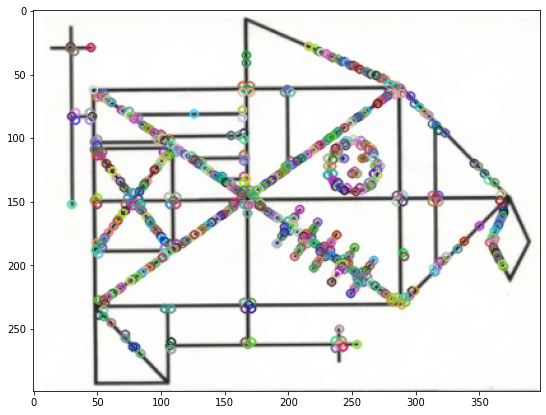

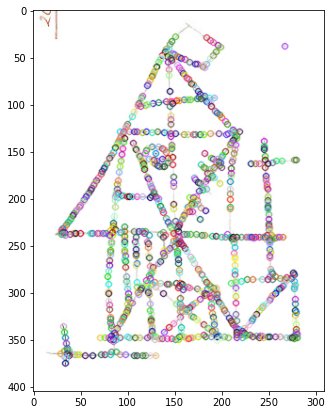


Number of Matching Keypoints Between The Training and Query Images:  184


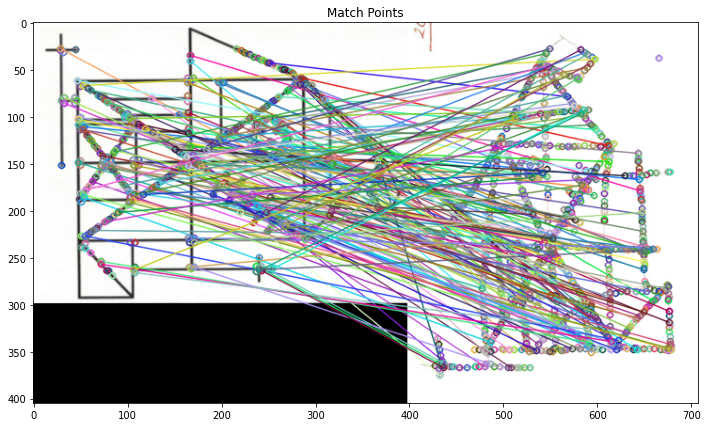

----------------

rey-205Ev3.png
Number of Keypoints Detected In The Training Image:  864


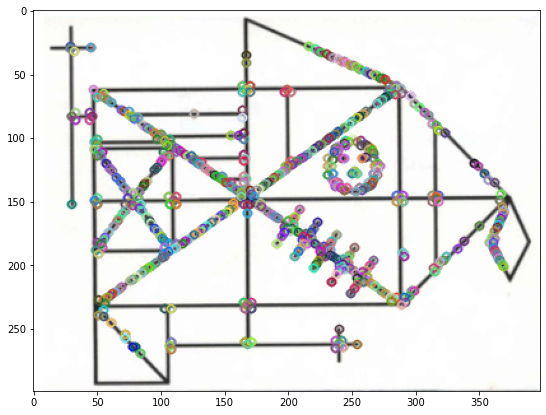

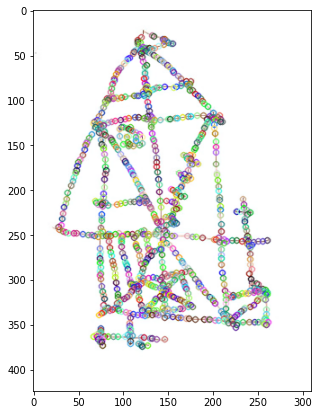


Number of Matching Keypoints Between The Training and Query Images:  168


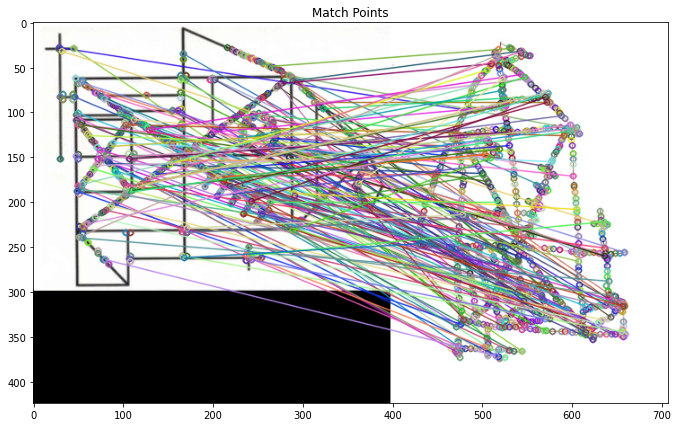

----------------

rey-209Ev3.png
Number of Keypoints Detected In The Training Image:  1179


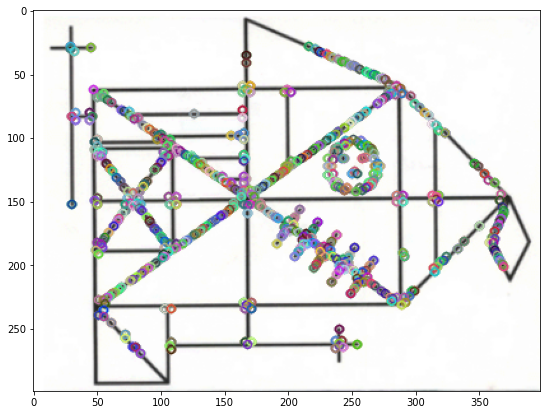

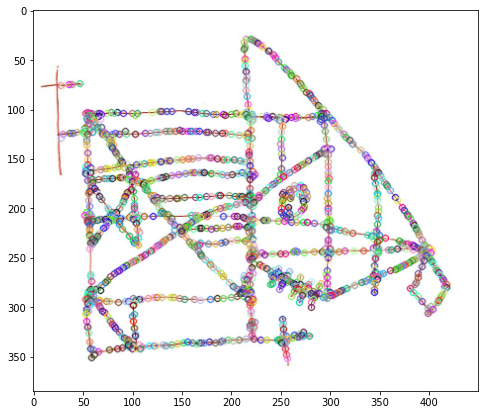


Number of Matching Keypoints Between The Training and Query Images:  199


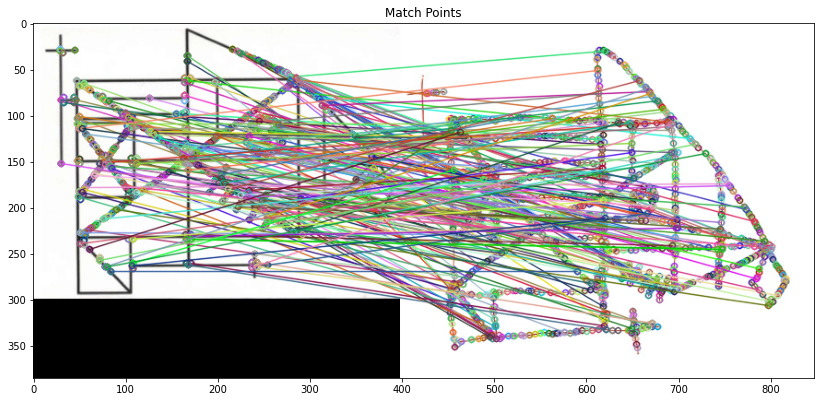

----------------

rey-208Ev2.png
Number of Keypoints Detected In The Training Image:  711


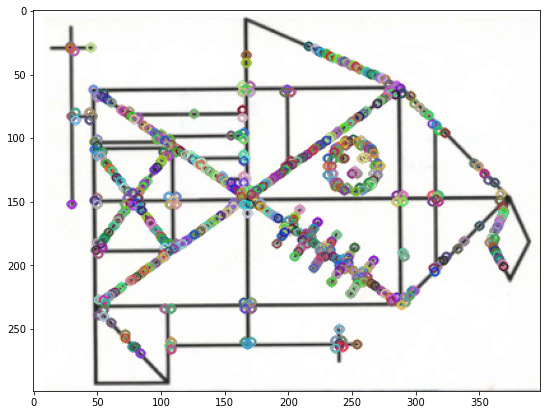

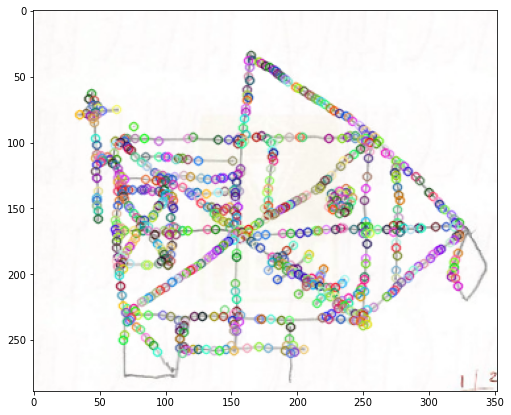


Number of Matching Keypoints Between The Training and Query Images:  168


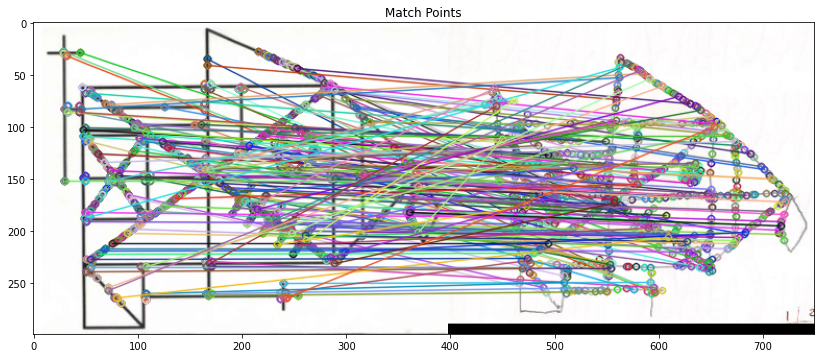

----------------

rey-202Ev1.png
Number of Keypoints Detected In The Training Image:  934


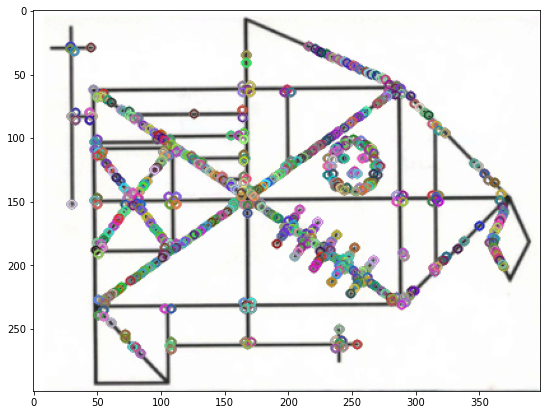

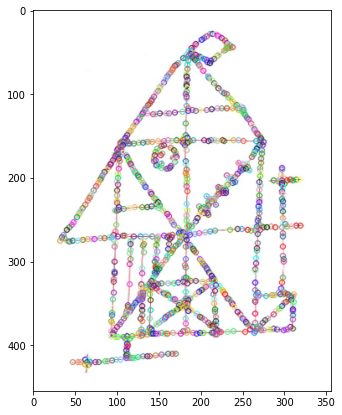


Number of Matching Keypoints Between The Training and Query Images:  179


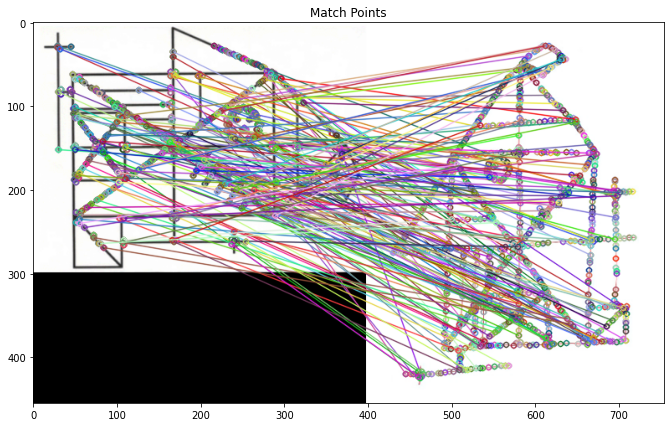

----------------

rey-202Ev2.png
Number of Keypoints Detected In The Training Image:  1022


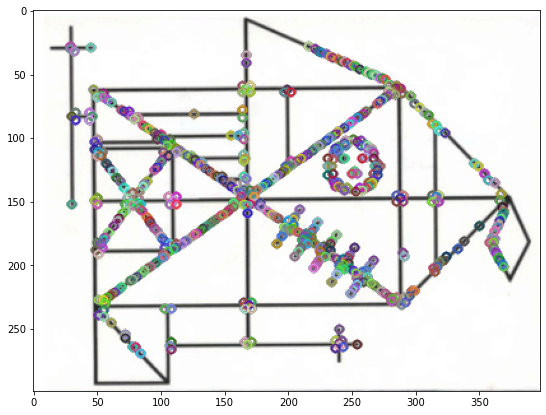

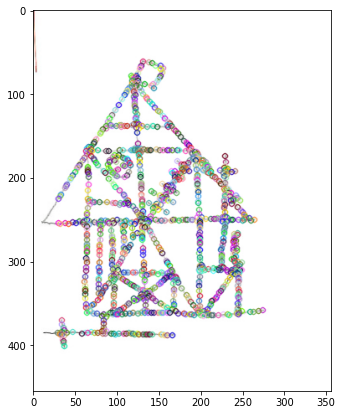


Number of Matching Keypoints Between The Training and Query Images:  184


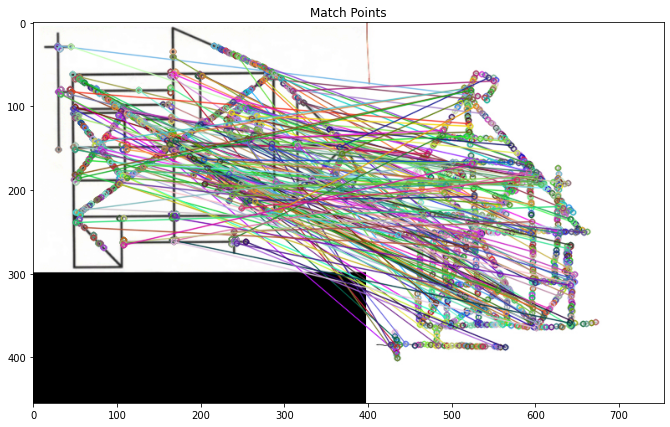

----------------

rey-203Ev2.png
Number of Keypoints Detected In The Training Image:  855


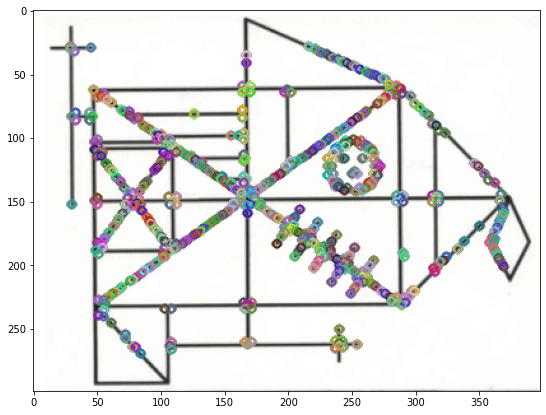

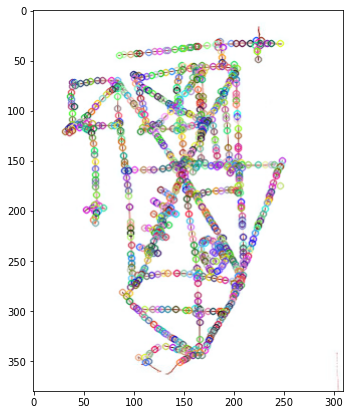


Number of Matching Keypoints Between The Training and Query Images:  165


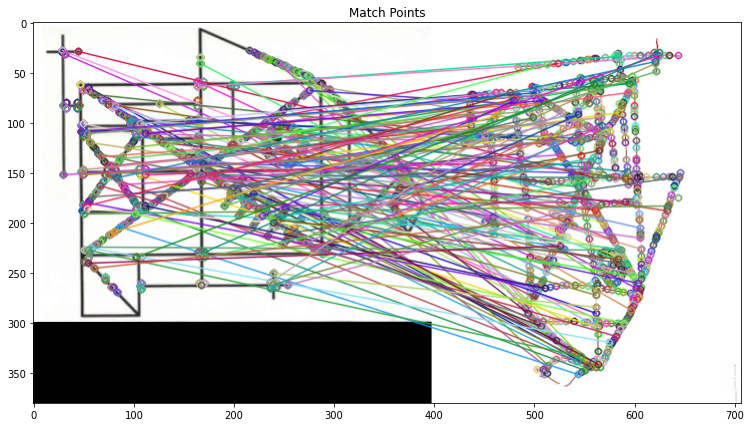

----------------

rey-202Ev3.png
Number of Keypoints Detected In The Training Image:  898


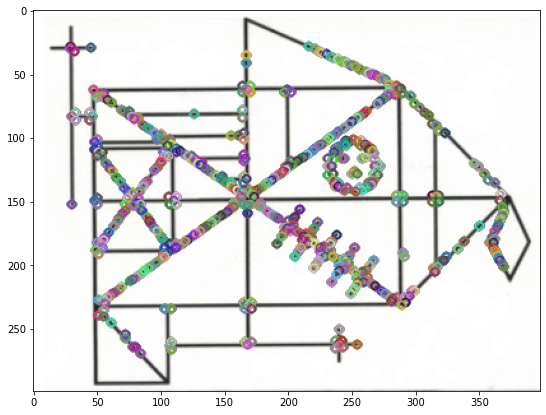

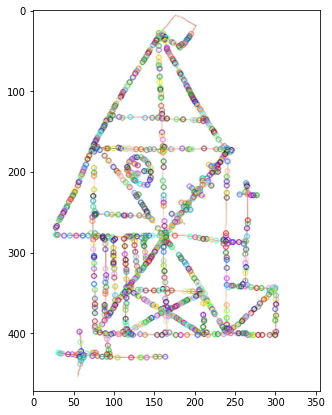


Number of Matching Keypoints Between The Training and Query Images:  170


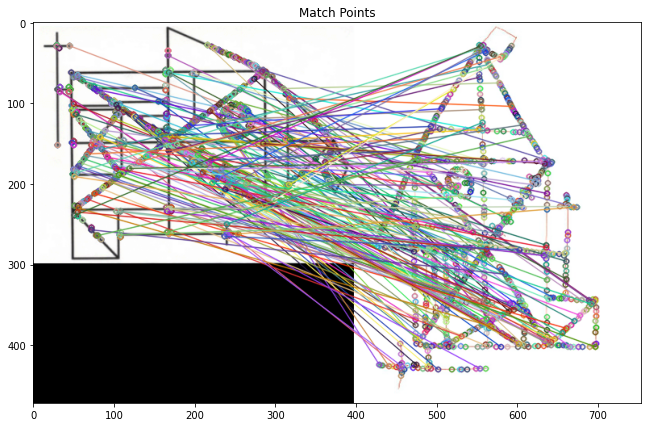

----------------

rey-210Ev2.png
Number of Keypoints Detected In The Training Image:  712


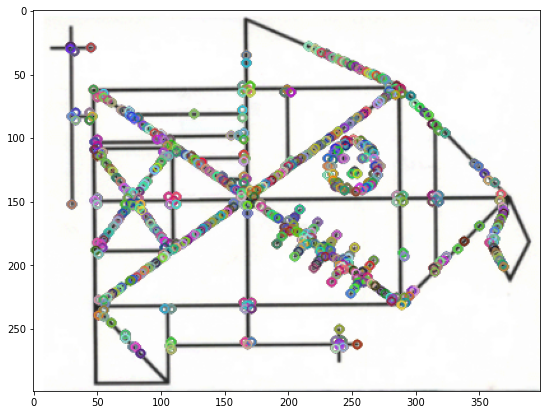

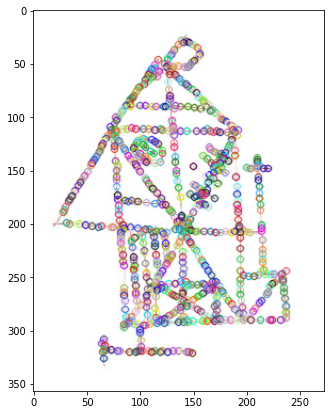


Number of Matching Keypoints Between The Training and Query Images:  168


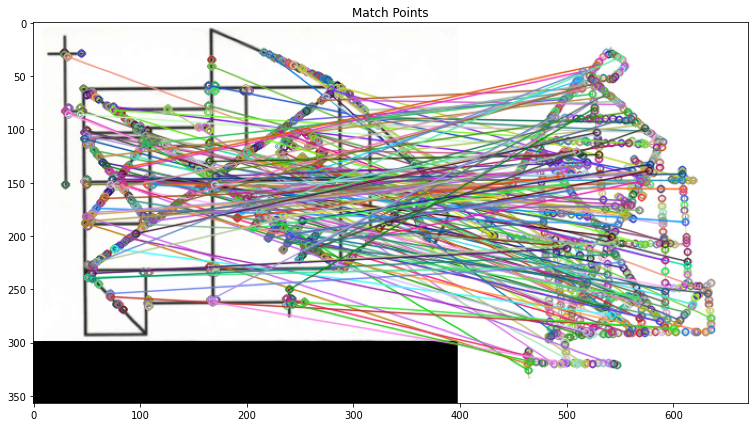

----------------

rey-204Ev1.png
Number of Keypoints Detected In The Training Image:  1136


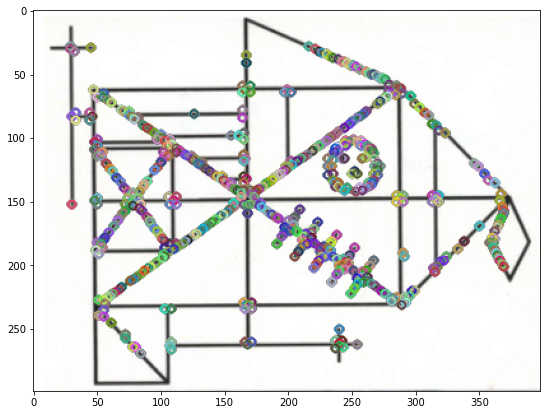

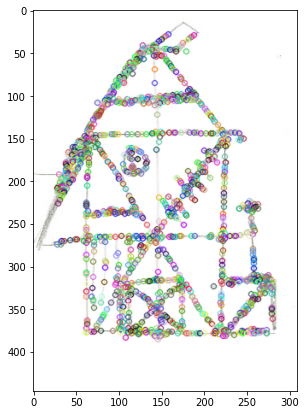


Number of Matching Keypoints Between The Training and Query Images:  179


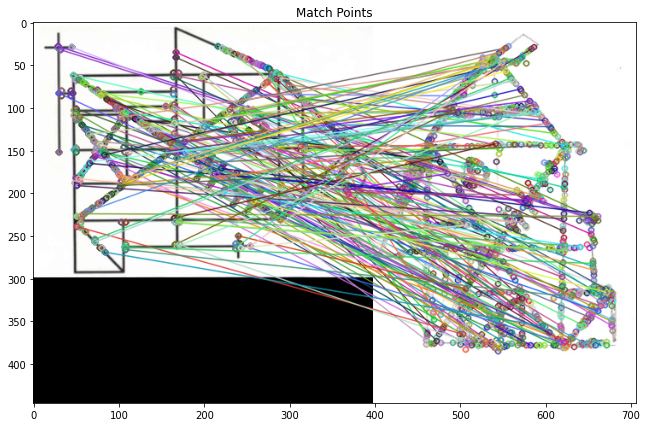

----------------

rey-206Ev5.png
Number of Keypoints Detected In The Training Image:  892


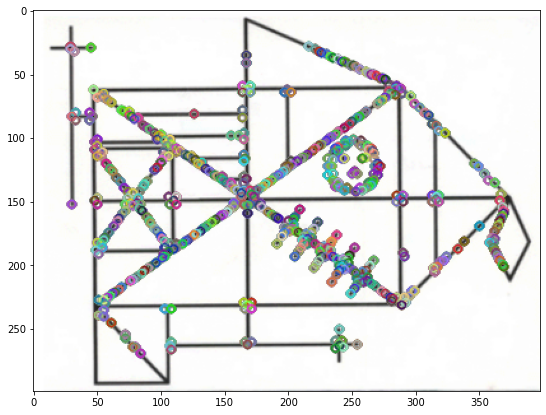

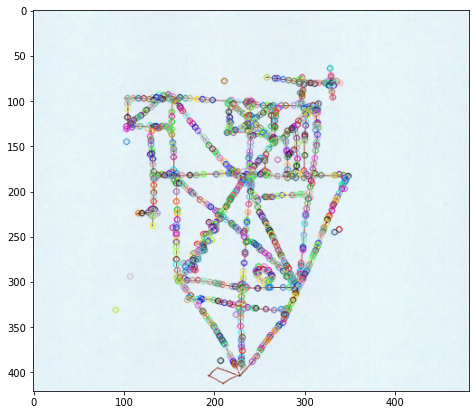


Number of Matching Keypoints Between The Training and Query Images:  194


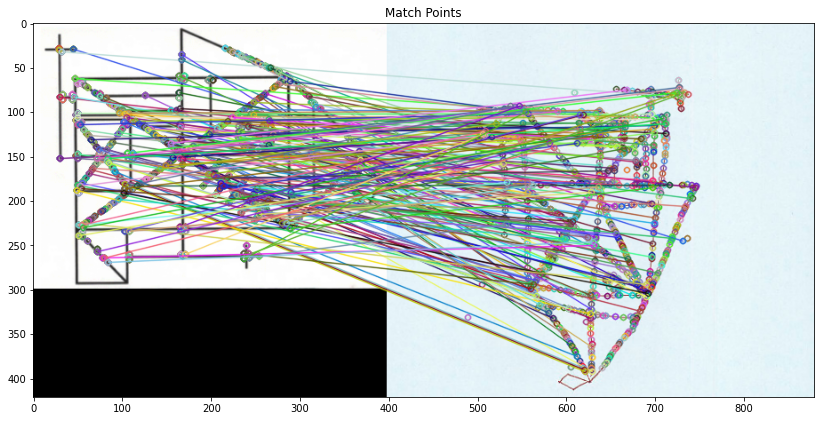

----------------

rey-206Ev2.png
Number of Keypoints Detected In The Training Image:  581


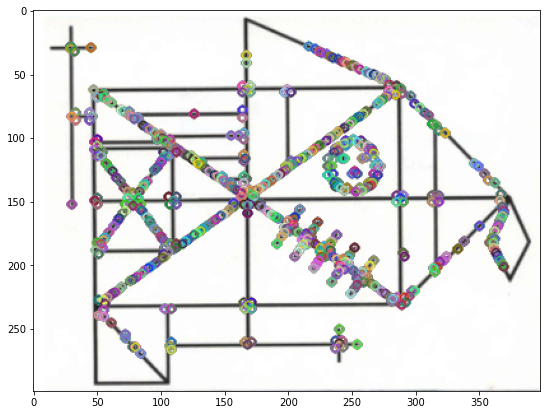

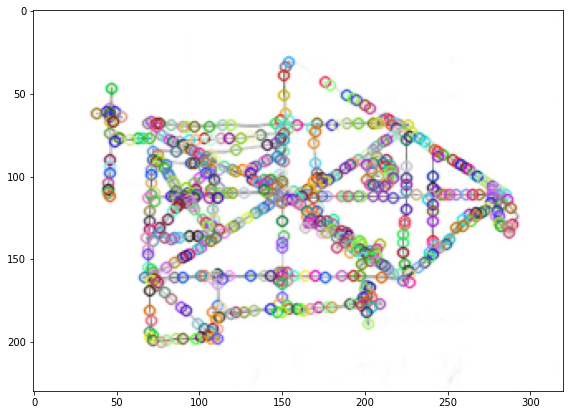


Number of Matching Keypoints Between The Training and Query Images:  149


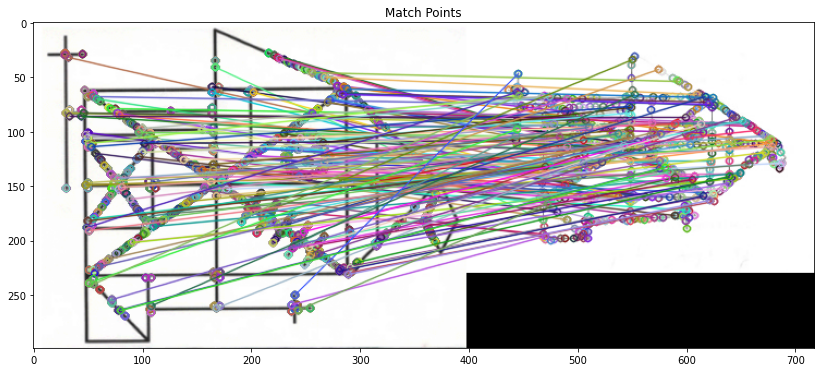

----------------

rey-205Ev1.png
Number of Keypoints Detected In The Training Image:  916


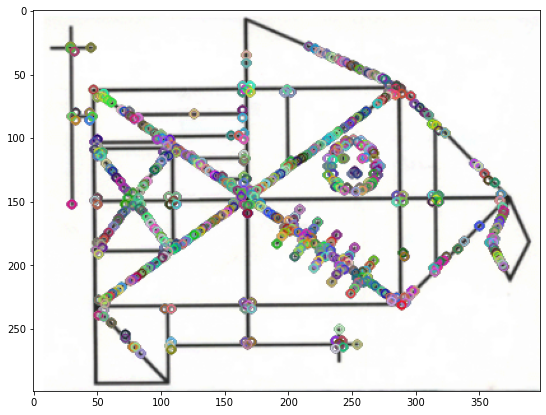

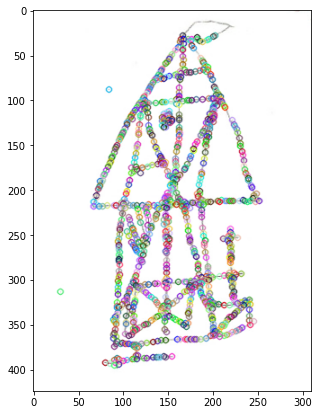


Number of Matching Keypoints Between The Training and Query Images:  159


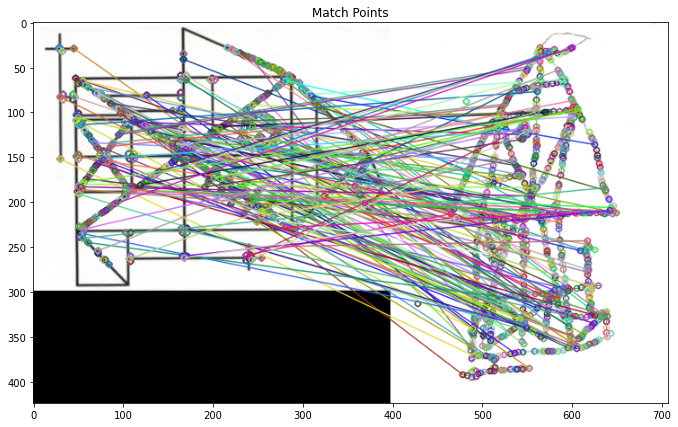

----------------

rey-205Ev4.png
Number of Keypoints Detected In The Training Image:  708


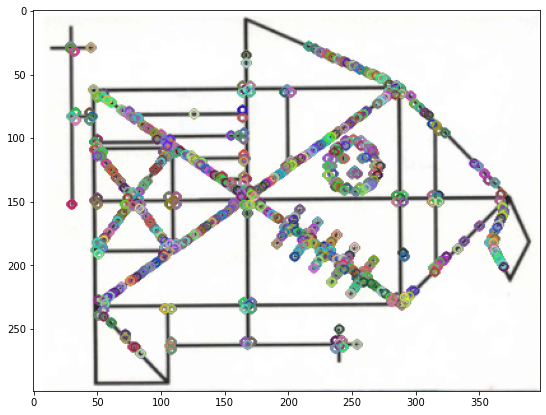

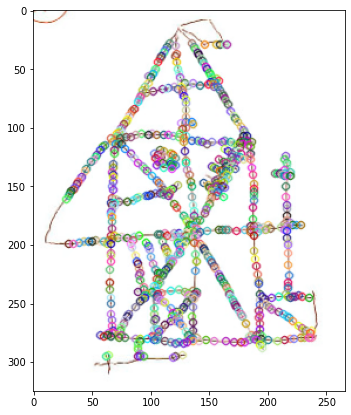


Number of Matching Keypoints Between The Training and Query Images:  160


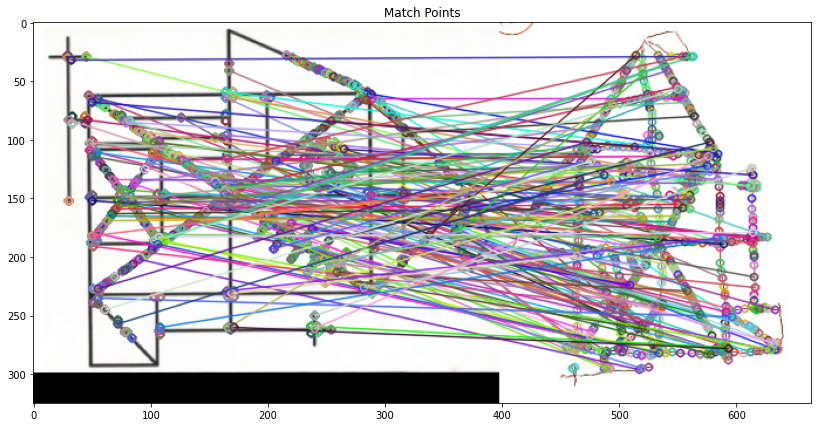

----------------

rey-202Ev4.png
Number of Keypoints Detected In The Training Image:  805


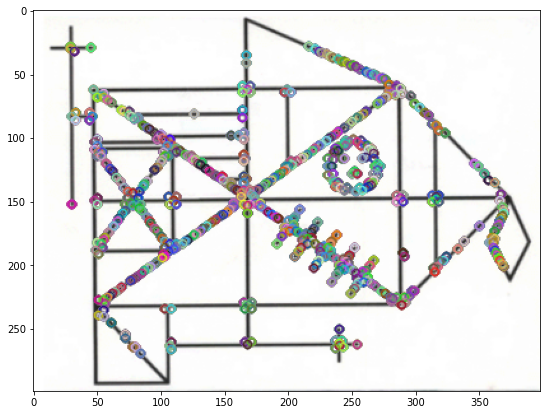

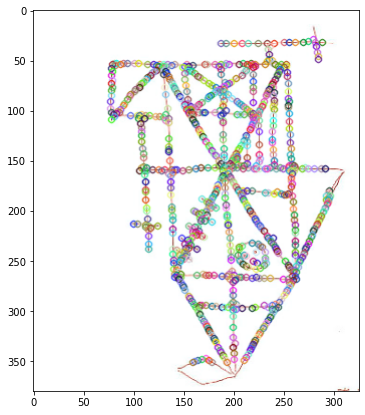


Number of Matching Keypoints Between The Training and Query Images:  158


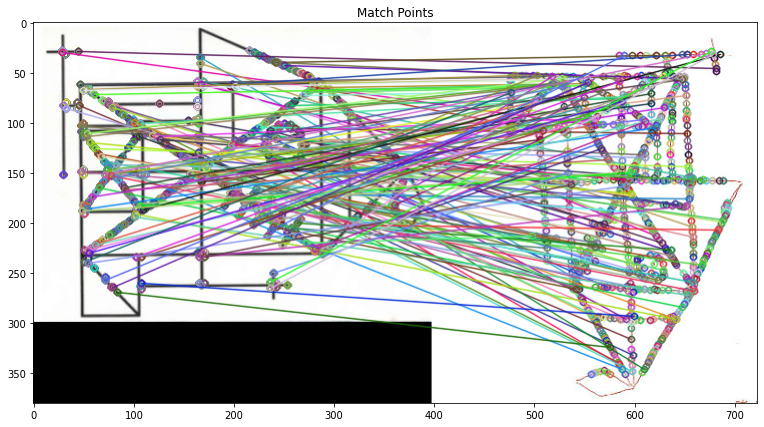

----------------

rey-213Ev1.png
Number of Keypoints Detected In The Training Image:  731


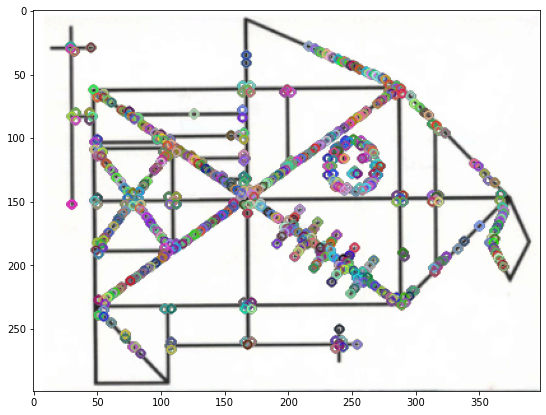

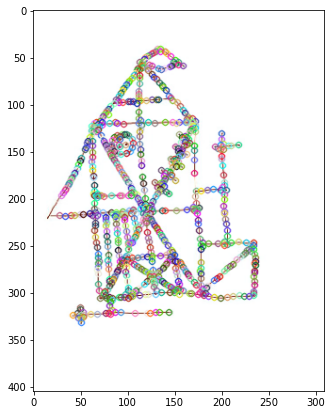


Number of Matching Keypoints Between The Training and Query Images:  178


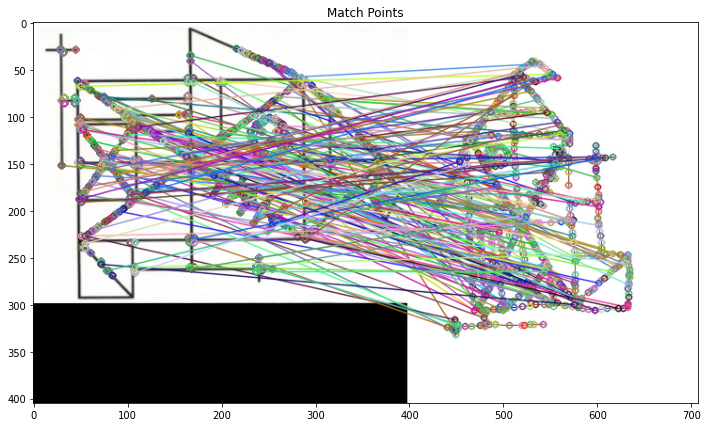

----------------

rey-209Ev2.png
Number of Keypoints Detected In The Training Image:  698


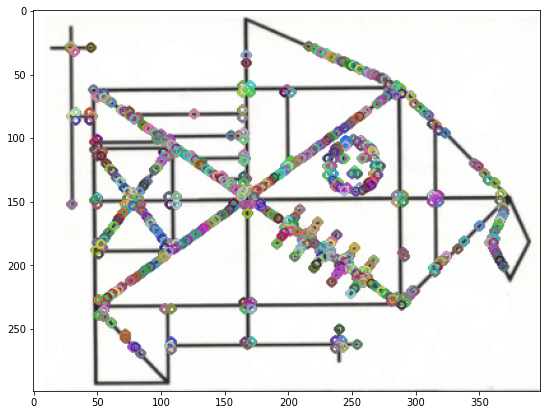

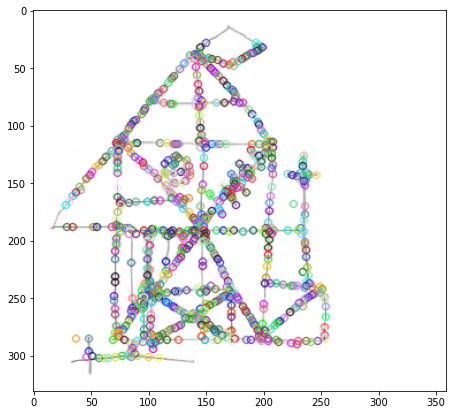


Number of Matching Keypoints Between The Training and Query Images:  164


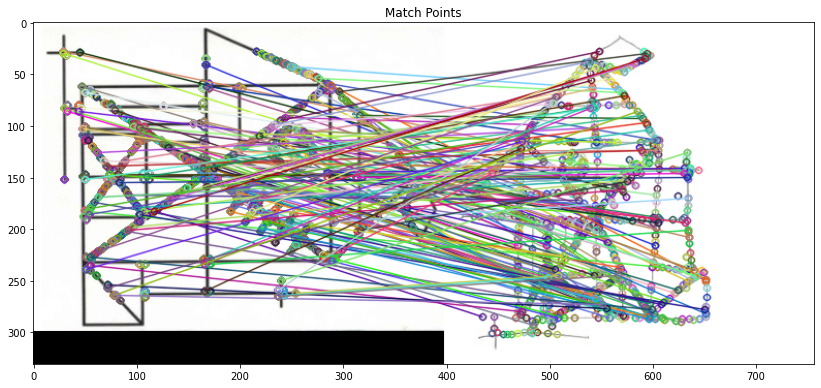

----------------

rey-205Ev41.png
Number of Keypoints Detected In The Training Image:  817


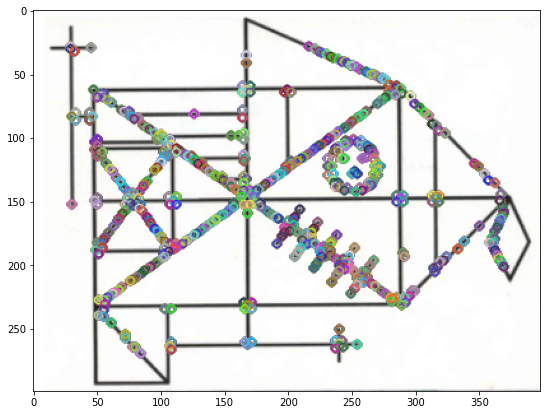

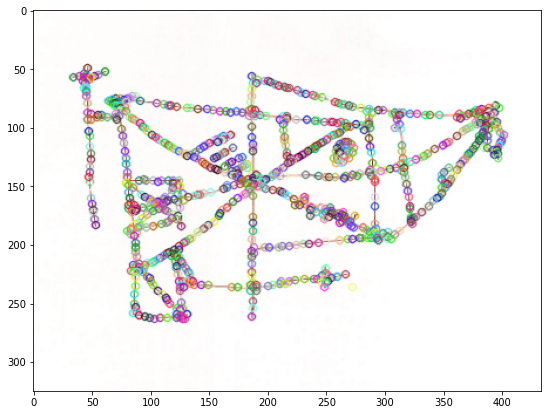


Number of Matching Keypoints Between The Training and Query Images:  172


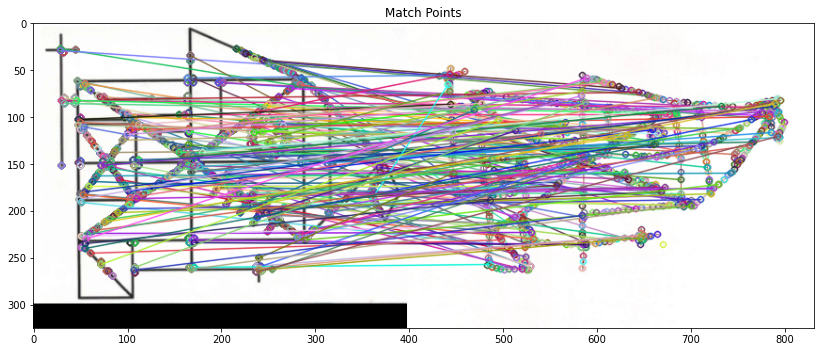

----------------

rey-206Ev3.png
Number of Keypoints Detected In The Training Image:  683


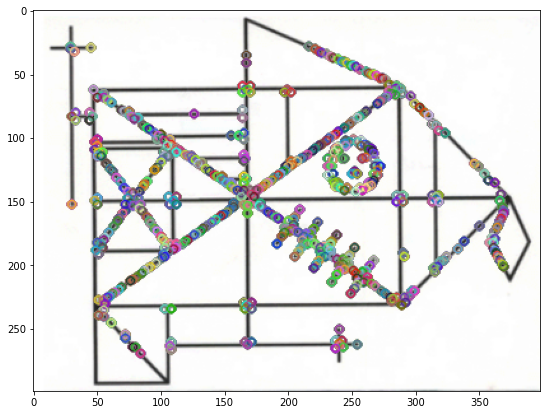

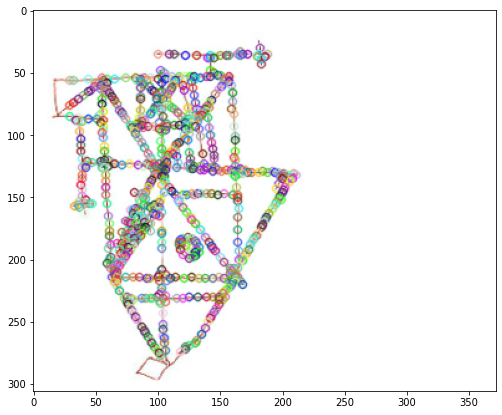


Number of Matching Keypoints Between The Training and Query Images:  158


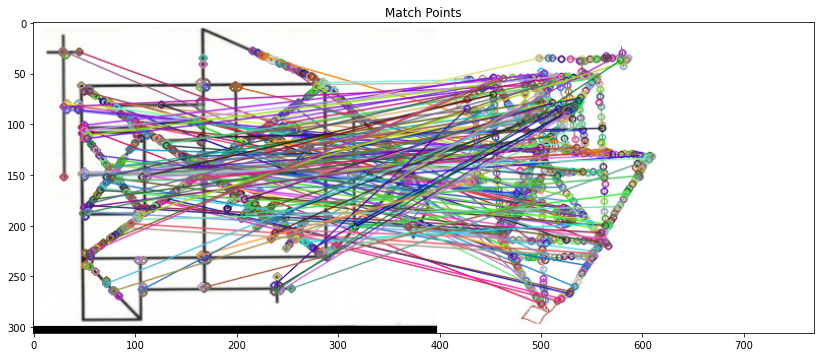

----------------



In [11]:
for image_name in dir_images:
  dir_image = f'{directory_folder}/{image_name}' 
  dir_tosave_image = f'{directory_tocopy_folder}/{image_name}' 
  trainImage = cv2.imread(dir_image, cv2.IMREAD_COLOR)  
  trainImage_keypoints, trainImage_descriptors = detectKeypoints(trainImage)  
  matches = getMatches(trainImage_descriptors) 
  
  print (image_name)
  # Print the number of keypoints detected in the training image
  print("Number of Keypoints Detected In The Training Image: ", len(trainImage_keypoints))
  printKeypoints(trainImage, trainImage_keypoints)
  print ('')
  print("Number of Matching Keypoints Between The Training and Query Images: ", len(matches))
  printMatches(trainImage, trainImage_keypoints, matches, dir_tosave_image)  
  print ('----------------')
  print ('')